# Using Machine Learning Tools: Workshop 5

The aim of this week's workshop is to get to know the task of classification and to apply and compare two different classification methods.

You will use [Wisconsin Breast Cancer data set](https://scikit-learn.org/stable/datasets/toy_dataset.html#breast-cancer-dataset), which is included in scikit learn (follow the link and read about what the dataset is)

Note: the link on webpage to the dataset is 'dead'. However, you can load the data directly using the below (as used in the below code):

`from sklearn.datasets import load_breast_cancer`

`data = load_breast_cancer()`


## **Setup and data loading**

Import required libraries and access the Wisconsin Breast Cancer data set by running the cells below.


In [3]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# To plot even prettier figures
import seaborn as sn

# General data handling (pure numerics are better in numpy)
import pandas as pd

In [4]:
# Load the dataset

from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()

In [5]:
# This is where the numerical data is
xarray = data.data
yarray = data.target

In [8]:
# This is where the names of features and targets are
print(f'Features names are: {data.feature_names}')
print()
print(f'Label names are: {data.target_names}')

Features names are: ['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave points' 'worst symmetry' 'worst fractal dimension']

Label names are: ['malignant' 'benign']


In [11]:
# We recommend inverting the labels so that malignant (the worse disease) = 1 (i.e. positive)
yarray = 1 - yarray
# Don't forget to switch the label names too (if you are going to use them anywhere)
# Though it is good practice to switch them here anyway, as future modifications to the code then won't get confused
data.target_names[0], data.target_names[1] = data.target_names[1], data.target_names[0]
data.target_names

array(['benign', 'malignant'], dtype='<U9')

In [12]:
# This is how you could put it all into a pandas dataframe (useful for some investigations)
df = pd.DataFrame(data.data, columns = data.feature_names)


## **Inspection and visualisation [15 mins]**

Familiarise yourself with the dataset and then use several different methods to display its properties, just like in Workshops 2 and 3. Pay particular attention to the class variable - this is often called the label or the target. The classifier aims to predict the label based on the remaining features in the data set. That makes it a supervised learning task.

In [14]:
# Add your code here to investigate the data further ...
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [15]:
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [16]:
sn.pairplot(df)

array([[<Axes: title={'center': 'mean radius'}>,
        <Axes: title={'center': 'mean texture'}>,
        <Axes: title={'center': 'mean perimeter'}>,
        <Axes: title={'center': 'mean area'}>,
        <Axes: title={'center': 'mean smoothness'}>],
       [<Axes: title={'center': 'mean compactness'}>,
        <Axes: title={'center': 'mean concavity'}>,
        <Axes: title={'center': 'mean concave points'}>,
        <Axes: title={'center': 'mean symmetry'}>,
        <Axes: title={'center': 'mean fractal dimension'}>],
       [<Axes: title={'center': 'radius error'}>,
        <Axes: title={'center': 'texture error'}>,
        <Axes: title={'center': 'perimeter error'}>,
        <Axes: title={'center': 'area error'}>,
        <Axes: title={'center': 'smoothness error'}>],
       [<Axes: title={'center': 'compactness error'}>,
        <Axes: title={'center': 'concavity error'}>,
        <Axes: title={'center': 'concave points error'}>,
        <Axes: title={'center': 'symmetry error'}>

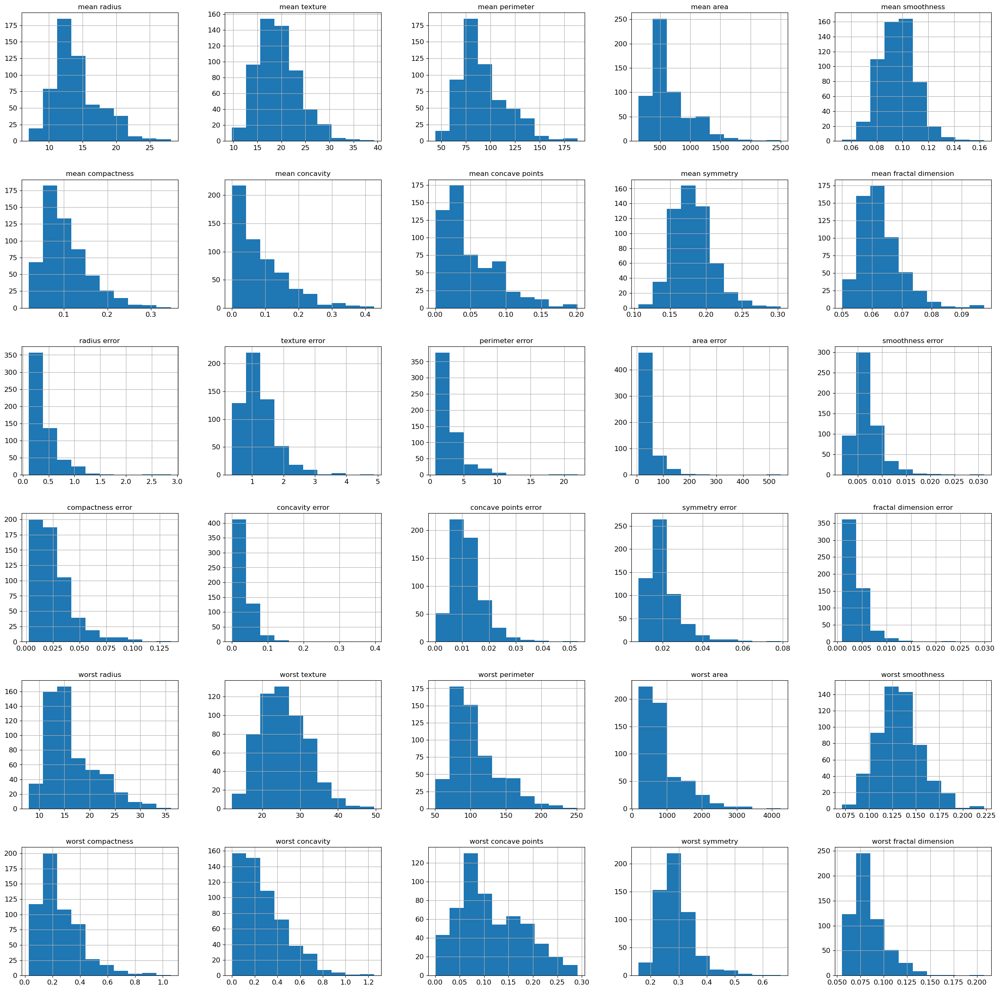

In [23]:
df.hist(figsize=(30,30))

<Axes: >

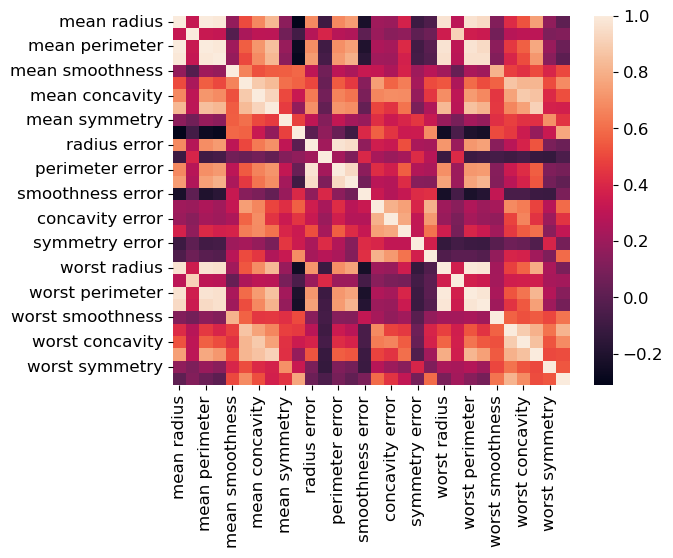

In [18]:
sn.heatmap(df.corr())

In [19]:
len(df.columns)

30

## **Splitting into separate datasets and building a pre-processing pipeline [10 mins]**

Split the data into a train and test set using an 80:20 ratio.
Then split the training part into a reduced training set and a validation set.  We will use a fixed hold-out validation set for this workshop, but we could have done K-fold cross-validation in the same way as we did for regression.

Once this is done, build an appropriate pre-processing pipeline, based on what you’ve seen in your investigations of the data above. What elements should you put in a pre-processing pipeline and why?

You can use tools like ChatGPT to help you write your code.

In [33]:
from sklearn.model_selection import train_test_split

# Your code for splitting into separate data sets goes here...
X_train, X_test, y_train, y_test = train_test_split(df.values, yarray, train_size=0.8, random_state = 42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, train_size=0.9, random_state = 42)

In [26]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

preproc_pl = Pipeline([('impute',SimpleImputer(missing_values=np.nan, strategy='mean')), ('standard', StandardScaler())]) 

## **Implementing a Stochastic Gradient Descent Classifier [20 mins]**

Build a new pipeline that includes your preprocessing and the Stochastic Gradient Descent classifier (which is a binary classifier that uses a linear model). You can find this in `sklearn.linear_model` called `SGDClassifier`. Use the parameter setting `loss=‘log’` (as this allows us to get probability outputs, whilst other loss functions, including the default, do not have anything except binary/integer outputs).

Train the classifier and then apply it to the validation set to get both binary class outputs and also probabilistic outputs using two separate calls, and store the outputs separately. We will use the binary class outputs for the next few steps, but will want the probabilities a little later.

After this:
* Display the results graphically, along with the true labels, in such a way that it is easy to identify which ones are correct or incorrect.
* Calculate the confusion matrix using confusion_matrix from sklearn.metrics
* Display this confusion matrix using the seaborn heatmap function, with annotations on (i.e. annot=True)
* Calculate and display a normalised version of the confusion matrix, such that each row (True classes) sums to 1.0
* Calculate the accuracy of the classification using accuracy_score from sklearn.metrics
* Calculate the precision and recall using sklearn’s precision_score and recall_score
* Calculate and display the Receiver-Operator-Characteristic (ROC) curve using roc_curve from sklearn.metrics
* Calculate the Area Under the Curve (AUC) using the function auc from sklearn.metrics
* Calculate and display the Precision-Recall curve (using precision_recall_curve). This plots Precision vs Recall in the same way as an ROC curve, as this is an alternative way of looking at things, but where the top right corner represents the best result. These are particularly useful when you don’t care about True Negatives, as these don’t feature in Precision or Recall.

You can use tools like ChatGPT to help you write your code.

In [34]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import SGDClassifier

# define the pipeline
pipeline_SGD = Pipeline([('preprocessing', preproc_pl), ('sgd', SGDClassifier(loss = 'log_loss'))])

# fit pipeline on train
pipeline_SGD.fit(X_train, y_train)

# 
y_val_pred_binary = pipeline_SGD.predict(X_val)
y_val_pred_proba = pipeline_SGD.predict_proba(X_val)

In [38]:
y_val_pred_proba = pipeline_SGD.predict_proba(X_val)


**Questions:**
* How many distinct points are there in the ROC curve? Try calculating the ROC curve again using the probability outputs instead. Look at the thresholds and compare these to the predicted probability outputs from the classifier (especially those where the classification was incorrect). There is an additional notebook (ROC.ipynb) provided in the MyUni module where you can observe how ROC curve is created.

* If this classifier would be used to make decisions in the hospital, which threshold would you choose? Is precision more important or recall? Do you think this classifier is good enough or does it need more optimisation?

## **Implementing a Decision Tree Classifier [20 mins]**

Train a decision tree classifier on the same training data using the `DecisionTreeClassifier` from `sklearn.tree`. The default parameters are fine for this.

Display the decision tree using the function `plot_tree` in `sklearn.tree`. Hint: To increase the resolution use `plt.rcParams['figure.dpi'] = 200` (if you did our standard `import matplotlib.pyplot as plt`)

After this:
* Apply the classifier to the validation set. Note that you cannot get a probability output from a single decision tree.
* Calculate the confusion matrix, precision and recall. Display the confusion matrix.
* Calculate and plot the ROC curve.
* Calculate the AUC.

You can use tools like ChatGPT to help you write your code.

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Your code here

**Questions:**
* What do each of the components (nodes, branches, thresholds) of the decision tree mean?
* Why are there so few points in the ROC curve?  Does it still show useful information?
* How does the decision tree compare to the SGD linear model? List 2 pros and 2 cons of each approach.

## **Model selection [20 mins]**

* What do you think would be a good performance metric to use in this case, and why? Choose one to work with here.

Note: A good answer here will depend on what you think is most important in the context of the task. If we want to try and supress False Negatives primarily then it would be good to choose an option with a good Recall, but still with acceptable Precision.  Based on the Precision-Recall curves alone you would normally choose the model with an operating point "nearest" to the top right. Looking at the class predictions (y_val_pred) as opposed to the probabilities (y_val_prob) shows that it is already choosing a good operating point, as shown also by the confusion matrices.

Compare the two models (pipelines) using your chosen performance metric, based on the results from the validation set.

Take the chosen model and re-train it on the combination of training and validation datasets.

Evaluate the chosen model on the test set. Compare the results to what you got from the validation data.

**Question:** What would it mean if there was a big difference between the performance scores on the validation and test datasets?

In [ ]:
# Your code here

## **Extension**

* How stable do you think these results are?
Try flipping the value in one element of a probability or class output (i.e. new_val = 1 - old_val) and see how much the results and curves change.